In [2]:
import os, glob, h5py, glob, sys, warnings, tqdm
import warnings
from timeit import default_timer as timer
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gp
from pyproj import Transformer
from pyproj import proj
import rasterio
from scipy.interpolate import LSQUnivariateSpline
from shapely.geometry import LineString
import geopandas as gpd
from shapely.geometry import Point

sys.path.append(r'C:\Users\Sebastian\U\Spatial\Internship\Bodo_website\ICESat-2_SVDA-main\python')

#from SVDA_helper_functions import *
from SVDA_functions import *
from pc_pool_clip  import *

## Setting the data

In [ ]:
#Opening the H5 file, selection the EPSG, output and exporting it as HDF file

#Input
ATL03_20200428193512 = '/DATA/Seb/internship/ATL03/fill_data/ATL03_20200428193512_05080706_005_01.h5'

#Output
ATL03_output_path = r"D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\big_hdf"

#Region of interest to be clipped from ATL03 file:
ROI_fname = r'C:\Users\Sebastian\U\Spatial\Internship\NSIDC\new_study_area\new_area-polygon.shp'
EPSG = 'epsg:7763'

#looping thorugh the files and esporting them as HDF
ATL03_files = list(glob.glob(ATL03_20200428193512))
ATL03_files.sort()
for fname in ATL03_files:
    ATL03_signal_photons(fname, ATL03_output_path, ROI_fname, EPSG, reprocess=False)

In [3]:
#Opening HDf files Land_*.hdf
ATL03_land_files = glob.glob(os.path.join(ATL03_output_path, 'ATL03_Land_*.hdf'))
ATL03_land_files.sort()

#Sorting the files by alongtrack 
ATL03_list = []
for i in range(len(ATL03_land_files)):
    ATL03_df = pd.read_hdf(ATL03_land_files[i], mode='r')
    ATL03_df = ATL03_df.sort_values(by=['alongtrack'], ascending=True).reset_index()
    ATL03_list.append(ATL03_df)

#Normalizing alongtrack values
def normalize_alongtrack(alongtrack):
    first_value = alongtrack[0]
    normalized = [x - first_value for x in alongtrack]
    return normalized

#Adding normalized alongtrack values to the list
ATL03_list[2]['alongtrack_real'] = normalize_alongtrack(ATL03_list[2]["alongtrack"])

In [4]:
# Dropping values that do not fit with the GDEM (outside of the boundaries)
column_name = 'index'
value = 2061732

# Find the index of the first occurrence of the specific value
drop_index = ATL03_list[2].loc[ATL03_list[2][column_name] == value].index[0]

# Drop rows after the drop index
ATL03_list[2] = ATL03_list[2].loc[:drop_index]

In [ ]:
# Create new df that includes all photons that have a confidence level of 4
ATL_qual = ATL03_list[2][ATL03_list[2]['Land'] >= 4]

#Create numpy array from ATL_qual that includes distance along track, photon height, Latitude and Longitude 
xx = ATL_qual[['alongtrack_real', 'Photon_Height', "Latitude", "Longitude"]].to_numpy()

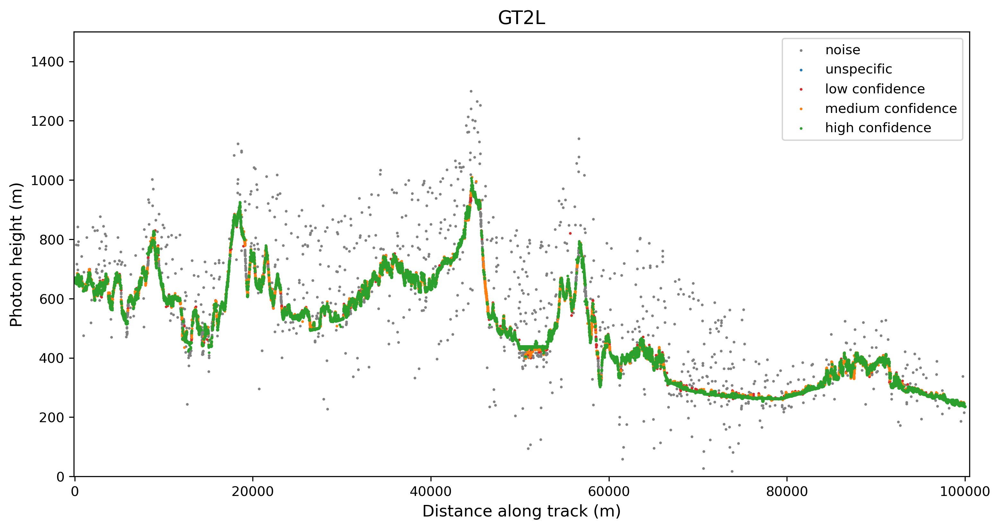

In [6]:
#Ploting the quality flag values of the ATL03 data
fig, ax = plt.subplots(1,1, figsize=(12,6))
fig.set_dpi(300)
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == 0],  ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 0],  s=1, label='noise', c='gray')
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == -1], ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == -1], s=1, label='unspecific', c='tab:blue')
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == 2],  ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 2],  s=1, label='low confidence', c='tab:red')
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == 3],  ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 3],  s=1, label='medium confidence', c='tab:orange')
ax.scatter(ATL03_list[2]['alongtrack_real'][ATL03_list[2]['Land'] == 4],  ATL03_list[2]['Photon_Height'][ATL03_list[2]['Land'] == 4],  s=1, label='high confidence', c='tab:green')
plt.ylim([0, 1500])
plt.xlim([-100, 100500])
ax.set_title("GT2L", fontsize=14)
ax.set_ylabel('Photon height (m)', fontsize=12)
ax.set_xlabel('Distance along track (m)', fontsize=12)
ax.legend(fontsize=10);
plt.savefig('GT2L.png', bbox_inches='tight')

## Plotting the data on the map

ICESat-2 data 

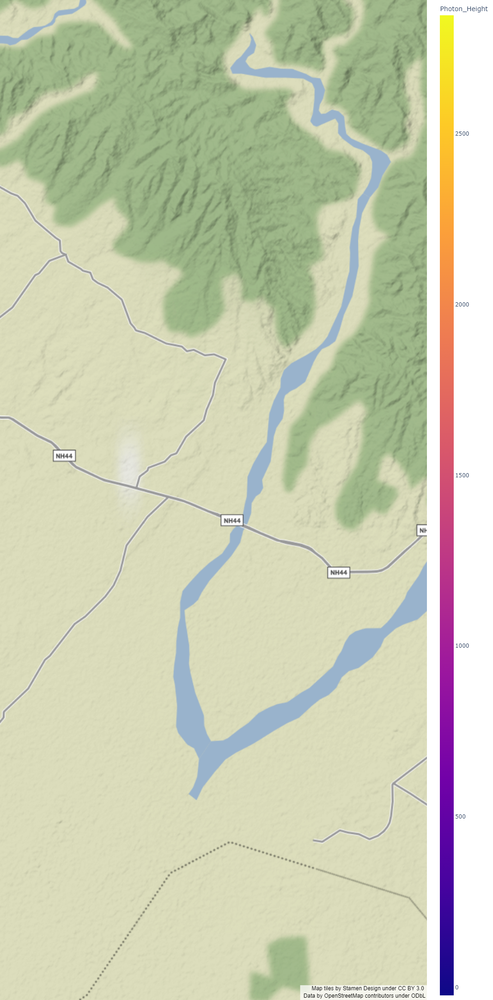

In [21]:
import plotly.express as px
fig = px.scatter_mapbox(ATL03_list[2], 
                        lat='Latitude', 
                        lon='Longitude',
                        color='Photon_Height', zoom=9)
fig.update_layout(mapbox_style="stamen-terrain")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

## SCIPY POLINOMIAL FIT

In [361]:
#Selecting parameters for the spline

#Knots
t = np.arange(xx[0,0]+1, xx[-1,0]-1, 100)
#Initialize
spl = LSQUnivariateSpline(xx[:,0], xx[:,1], t)
#Define new x-coordinates for interpolation
xs = np.linspace(xx[0,0]+1, xx[-1,0]-1, 42614)

# Define the file path for the shapefile
output_shapefile = "interpolation_curve.shp"

# Export the GeoDataFrame to a shapefile
gdf.to_file(output_shapefile)

SLOPE FINDING

In [362]:
# Generate a sample topographic curve
x = xs
y = spl(xs)

# Calculate the slope at each point on the curve using numerical differentiation
dx = x[1] - x[0]
dydx = np.gradient(y, dx)

# Identify points where the slope is close to 0
tolerance = 0.0001
flat_points = np.where(np.abs(dydx) < tolerance)[0]

#Vertical zones
vertical_lines = [10000,20000,30000,40000,50000,60000,70000,80000,90000]

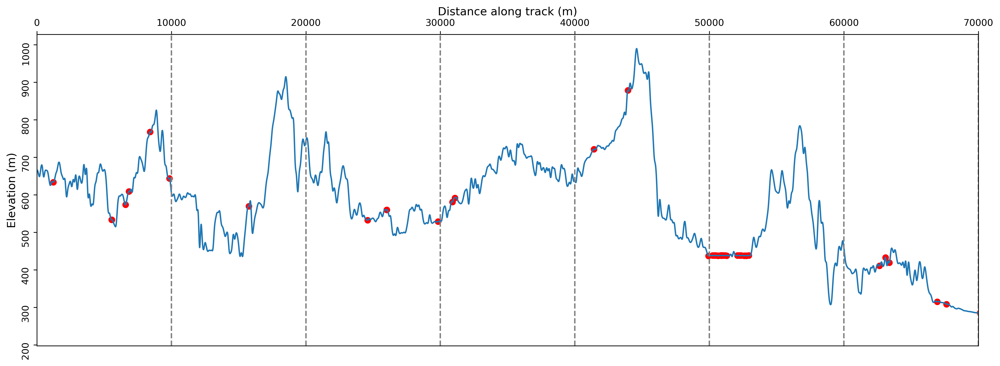

In [383]:
# Plot the results
fig, ax = plt.subplots(figsize=(18,6))
fig.set_dpi(300)
ax.plot(x, y, label="LSQ Interpolation")
ax.scatter(x[flat_points], y[flat_points], color='red', label='Flat areas')
for line in vertical_lines:
    plt.axvline(x=line, color='grey', linestyle='--')

ax.set_xlim(0, 70000)
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.set_yticks(range(200, 1100, 100))
ax.set_yticklabels(range(200, 1100, 100), rotation=90)
plt.xlabel('Distance along track (m)', fontsize=12)
plt.ylabel("Elevation (m)", fontsize=12)
plt.savefig("Int and flat areas.png", bbox_inches='tight')

EXPORTING THE FLAT AREAS

In [368]:
# Create a list of Point geometries for the flat points
points = [Point(xx[:,2][i], xx[:,3][i]) for i in flat_points]

# Create a binary column indicating flat points (1) or not (0)
binary_column = np.zeros(len(xx))
binary_column[flat_points] = 1

#flat_values = xx[flat_points, 1]  # Assuming the flat point values are in the second column (Photon_Height)
data = {"flat_points": binary_column}

df = gpd.GeoDataFrame(data, geometry=gp.points_from_xy(xx[:, 3], xx[:, 2], crs=4326))

# Define the file path for the shapefile
#output_shapefile = "flat_points_mod.shp"

# save the GeoDataFrame to a shapefile
#warnings.simplefilter('ignore', category=UserWarning)
#df.to_file(output_shapefile, driver='ESRI Shapefile')

## SLOPE THRESHOLDING AND VARIANCE

In [227]:
# DataFrame
data = {'Xs': xs, 'Spl': spl(xs)}
df_regression = pd.DataFrame(data)

# Number of rows to extract in each portion
portion_size = 10500

# Extract portions of the DataFrame
portions = []
start_idx = 0
while start_idx < len(df_regression):
    end_idx = min(start_idx + portion_size, len(df_regression))
    portion = df_regression.iloc[start_idx:end_idx]
    portions.append(portion)
    start_idx += portion_size


In [228]:
#Splitting the area into 5 portions
x_hist = df_regression[['Xs', 'Spl']].to_numpy()
x_hist_2000 = portions[0][['Xs', 'Spl']].to_numpy()
x_hist_4000 = portions[1][['Xs', 'Spl']].to_numpy()
x_hist_6000 = portions[2][['Xs', 'Spl']].to_numpy()
x_hist_8000 = portions[3][['Xs', 'Spl']].to_numpy()
x_hist_10000 = portions[4][['Xs', 'Spl']].to_numpy()

In [229]:
def calculate_slope_degrees(data):
    # Extract alongtrack and height columns
    alongtrack = data[:, 0]
    height = data[:, 1]
    # Calculate the first derivative (slope) using finite differences
    slope = np.gradient(height, alongtrack)
    # Convert slope to degrees
    slope_degrees = np.degrees(np.arctan(slope))
    return slope_degrees

In [232]:
#Using the previous function in order to calculate the slope of the histogram for each of the 5 different values of the number of bins.
slope_degrees = calculate_slope_degrees(x_hist_2000)
abs_slope_2000 = np.abs(slope_degrees)

slope_degrees = calculate_slope_degrees(x_hist_4000)
abs_slope_4000 = np.abs(slope_degrees)

slope_degrees = calculate_slope_degrees(x_hist_6000)
abs_slope_6000 = np.abs(slope_degrees)

slope_degrees = calculate_slope_degrees(x_hist_8000)
abs_slope_8000 = np.abs(slope_degrees)

slope_degrees = calculate_slope_degrees(x_hist_10000)
abs_slope_10000 = np.abs(slope_degrees)

In [233]:
#Selecting the range of the slope
range_min = 0
range_max = 90

#Slope histograms
slp_deg_hist_2000, slp_deg_bin_edges = np.histogram(abs_slope_2000, slope_bins)
slp_deg_bin_centers_2000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

slp_deg_hist_4000, slp_deg_bin_edges = np.histogram(abs_slope_4000, slope_bins)
slp_deg_bin_centers_4000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

slp_deg_hist_6000, slp_deg_bin_edges = np.histogram(abs_slope_6000, slope_bins)
slp_deg_bin_centers_6000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

slp_deg_hist_8000, slp_deg_bin_edges = np.histogram(abs_slope_8000, slope_bins)
slp_deg_bin_centers_8000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

slp_deg_hist_10000, slp_deg_bin_edges = np.histogram(abs_slope_10000, slope_bins)
slp_deg_bin_centers_10000 = slp_deg_bin_edges[:-1] + np.diff(slp_deg_bin_edges)/2

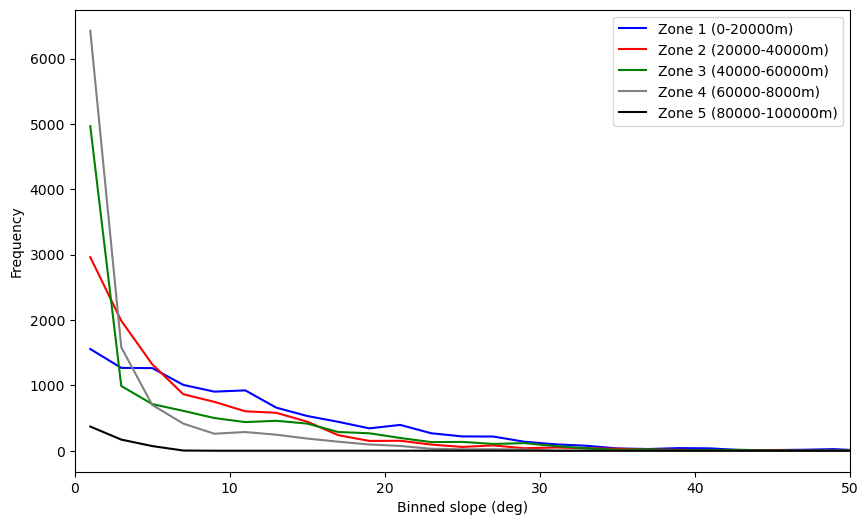

In [388]:
fg, ax = plt.subplots(1, 1, figsize=(10,6))
fig.set_dpi(300)
im=ax.plot(slp_deg_bin_centers_2000, slp_deg_hist_2000, "b-", label="Zone 1 (0-20000m)")
im=ax.plot(slp_deg_bin_centers_4000, slp_deg_hist_4000, "r-", label="Zone 2 (20000-40000m)")
im=ax.plot(slp_deg_bin_centers_6000, slp_deg_hist_6000, "green", label="Zone 3 (40000-60000m)")
im=ax.plot(slp_deg_bin_centers_8000, slp_deg_hist_8000, "gray", label="Zone 4 (60000-8000m)")
im=ax.plot(slp_deg_bin_centers_10000, slp_deg_hist_10000, "k-", label="Zone 5 (80000-100000m)")
ax.set_xlabel('Binned slope (deg)')
ax.set_ylabel('Frequency')
ax.set_xlim(0,50)
#ax.grid('on')
#plt.title('Slope comparison per zones every 20.000 m')
plt.legend()
plt.savefig("Slope distribution per sectors.png", bbox_inches='tight')

## COMPARISSON WITH GDEM

In [390]:
# Copernicus GLO-30 DEM
src_glo30 = rasterio.open(r'D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\Qgis\output_COP30.tif')
array_glo30 = src_glo30.read(1)
array_glo30[array_glo30==src_glo30.nodata] = np.nan

# JAX 3m DEM
src_qdt3 = rasterio.open(r'D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\Qgis\N031E076\ALPSMLC30_N031E076_DSM.tif')
array_qdt3 = src_qdt3.read(1, masked=True).astype(float)
array_qdt3[array_qdt3==src_qdt3.nodata] = np.nan

# SRTM Sector 51 5 m DEM
src_salta5 = rasterio.open(r'D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\Qgis\n31_e076_1arc_v3.tif')
array_salta5 = src_salta5.read(1).astype(float)
array_salta5[array_salta5==src_salta5.nodata] = np.nan

# Geoid (to correct differences in vertical datum)
src_geoid = rasterio.open(r'D:\Datos de Usuario\Univ\Semester_4\Internship_thesis\Qgis\us_nga_egm2008_1.tif')
array_geoid = src_geoid.read(1)
array_geoid[array_geoid==src_geoid.nodata] = np.nan

In [391]:
l =  ATL_qual['alongtrack_real'].max()
s = 0

ATL_qual = ATL03_list[2][ATL03_list[2]['Land'] >= 4]

xx = ATL_qual[['alongtrack_real', 'Photon_Height']].to_numpy()

# create new array that is subsetted by defined segment
xx = xx[(xx[:,0] >= s) & (xx[:,0] < s+l)]

# create new df: subset the confidence df by defined section
ATL_clip = ATL_qual[(ATL_qual['alongtrack_real'] >= s) & (ATL_qual['alongtrack_real'] < s+l)]

# create geodataframe from subsetted ATL03 df, add geometry column from photon's longitude and latitude in wgs84 crs
gdf = gp.GeoDataFrame(ATL_clip, geometry=gp.points_from_xy(ATL_clip.Longitude, ATL_clip.Latitude), crs=4326)
# write geometry to a list of coordinates
coord_list = [(x,y) for x,y in zip(gdf['geometry'].x , gdf['geometry'].y)]

In [392]:
# write values of DEMs at the coordinate in the list to a new column in the geodataframe
gdf['geoid_undul'] = [x for x in src_geoid.sample(coord_list)]
gdf['geoid_float'] = gdf.geoid_undul.astype(float)

gdf['glo30_height'] = [x for x in src_glo30.sample(coord_list)]
gdf['glo30_float'] = gdf.glo30_height.astype(float)

#fix difference between height crs (geoid undulation)
gdf['glo30_ell'] = np.add(gdf.glo30_float, gdf.geoid_float).astype(float)

gdf_swath1 = gdf.drop(['geoid_undul', 'glo30_height', 'glo30_float'], axis=1)

gdf['qdt3_height'] = [x for x in src_qdt3.sample(coord_list)]
gdf['qdt3_float'] = gdf.qdt3_height.astype(float)

# nodata value is converted to nan to not influence results
gdf['qdt3_float'] = np.add(gdf.qdt3_float, gdf.geoid_float)
    
gdf['salta5_height'] = [x for x in src_salta5.sample(coord_list)]
gdf['salta5_float'] = gdf.salta5_height.astype(float)

#gdf = gdf.replace(src_salta5.nodata, np.nan)
gdf['salta5_float'] = np.add(gdf.salta5_float, gdf.geoid_float)
    
# new dataframe where initial sample columns are dropped (float columns remain)
gdf2 = gdf.drop(['geoid_undul', 'glo30_height', 'glo30_float', 'qdt3_height', 'salta5_height'], axis=1)

SCATTER PLOTS

In [393]:
#Defining the variables to create the scatter plots
x = gdf2.Photon_Height
y = [gdf2.glo30_ell, gdf2.qdt3_float, gdf2.salta5_float]
names_DEM = ["Copernicus", "JAXA", "SRTM"]
r2_gdem = []
yest_gdem = []
ssr_gdem = []
predicted_gdem = []
mae_gdem = []
rmse_gdem = []
best = []
aest = []
seb = []
sea = []
residuals_list = []

In [394]:
#Loop through the variables and calculate the regression parameters 
for i in range(len(y)):
    res = stats.linregress(x, y[i])
    B_est, A_est, r, p, se_B, se_A = res.slope, res.intercept, res.rvalue, res.pvalue, res.stderr, res.intercept_stderr
    y_est = A_est + B_est * x
    resid = y[i] - y_est
    r2 = r**2
    n = x.size
    ssr = np.sum((resid) ** 2)
    #mse = (ssr / (n - 2))
    rmse = np.sqrt(ssr / (n - 2))
    predicted = res.intercept + res.slope * x
    mae = np.mean(np.abs(predicted - y[i]))
    residuals = y[i] - (res.slope * x + res.intercept)
    
    best.append(B_est)
    aest.append(A_est)
    seb.append(se_B)
    sea.append(se_A)
    yest_gdem.append(y_est)
    r2_gdem.append(r2)
    ssr_gdem.append(ssr)
    predicted_gdem.append(predicted)
    mae_gdem.append(mae)
    rmse_gdem.append(rmse)
    residuals_list.append(residuals)

In [395]:
# set the confidence level, 0.05 is 95%
alpha = 0.05

# use scipy to look up the t-value for given parameters
t = stats.t.ppf(1 - (alpha/2), n - 2)

print("critical t-value at {:.1f}% confidence with {} degrees of freedom: {:.3f}"\
      .format(100*(1 - alpha), n - 2, t))
print("t-statistic for slope (number of standard errors that the slope differs from 0 slope): {:.3f}"\
      .format(r * np.sqrt(n - 2) / np.sqrt(1 - r**2)))

critical t-value at 95.0% confidence with 42611 degrees of freedom: 1.960
t-statistic for slope (number of standard errors that the slope differs from 0 slope): 4028.847


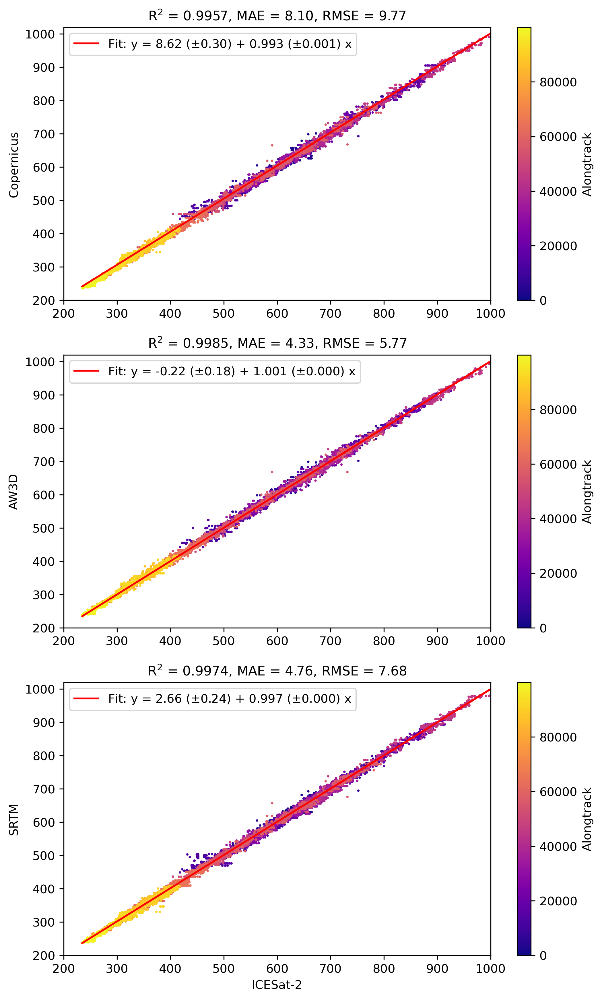

In [404]:
fig, axes = plt.subplots(3, 1, figsize=(8, 14))
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)

a = ax1.scatter(x, y[0], c=gdf2.alongtrack_real, cmap='plasma', s=1)
b = ax2.scatter(x, y[1], c=gdf2.alongtrack_real, cmap='plasma', s=1)
c = ax3.scatter(x, y[2], c=gdf2.alongtrack_real, cmap='plasma', s=1)
    
ax1.set_title("R$^2$ = {:0.4f}, MAE = {:0.2f}, RMSE = {:0.2f}".format(r2_gdem[0], mae_gdem[0], rmse_gdem[0]), fontsize=11)
ax2.set_title("R$^2$ = {:0.4f}, MAE = {:0.2f}, RMSE = {:0.2f}".format(r2_gdem[1], mae_gdem[1], rmse_gdem[1]), fontsize=11)
ax3.set_title("R$^2$ = {:0.4f}, MAE = {:0.2f}, RMSE = {:0.2f}".format(r2_gdem[2], mae_gdem[2], rmse_gdem[2]), fontsize=11)

ax1.plot(x, yest_gdem[0], 'r-', 
         label="Fit: y = {:0.2f} ($\pm${:0.2f}) + {:0.3f} ($\pm${:0.3f}) x".format(aest[0], t * sea[0], best[0], t * seb[0]))
ax2.plot(x, yest_gdem[1], 'r-', 
         label='Fit: y = {:0.2f} ($\pm${:0.2f}) + {:0.3f} ($\pm${:0.3f}) x'.format(aest[1], t * sea[1], best[1], t * seb[1]))
ax3.plot(x, yest_gdem[2], 'r-', 
         label='Fit: y = {:0.2f} ($\pm${:0.2f}) + {:0.3f} ($\pm${:0.3f}) x'.format(aest[2], t * sea[2], best[2], t * seb[2]))
   
cbar = plt.colorbar(a, label="Alongtrack")
ax1.set_ylabel('Copernicus', fontsize=10)
ax1.axis([200, 1000, 200, 1020])
ax1.legend(fontsize=10)

cbar = plt.colorbar(b, label="Alongtrack")
ax2.set_ylabel('AW3D', fontsize=10)
ax2.axis([200, 1000, 200, 1020])
ax2.legend(fontsize=10)

cbar = plt.colorbar(c, label="Alongtrack")
ax3.set_xlabel('ICESat-2', fontsize=10)
ax3.set_ylabel('SRTM', fontsize=10)
ax3.axis([200, 1000, 200, 1020])
ax3.legend(fontsize=10)

plt.savefig("ICESat-2 vs Global DEMs with statistics.png", bbox_inches='tight')

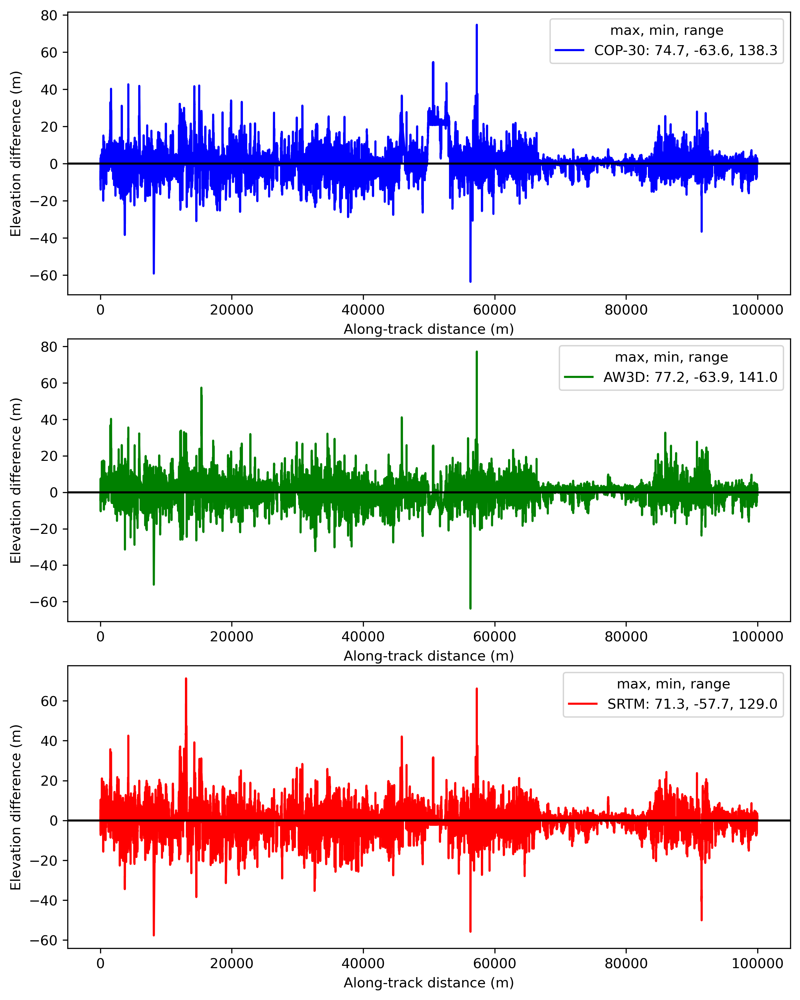

In [192]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10))
fig.tight_layout()
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)

diff = gdf2.glo30_ell - gdf2.Photon_Height
ax1.plot(gdf2.alongtrack_real, diff, "b", label=f'COP-30: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

diff = gdf2.qdt3_float - gdf2.Photon_Height
ax2.plot(gdf2.alongtrack_real, diff, "g", label=f'AW3D: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

diff = gdf2.salta5_float - gdf2.Photon_Height
ax3.plot(gdf2.alongtrack_real, diff, "red", label=f'SRTM: {np.nanmax(diff):.1f}, {np.nanmin(diff):.1f}, {np.nanmax(diff)-np.nanmin(diff):.1f}')

ax1.axhline(0, color='k')
ax2.axhline(0, color='k')
ax3.axhline(0, color='k')

ax1.set_xlabel('Along-track distance (m)', fontsize=10)
ax1.set_ylabel('Elevation difference (m)', fontsize=10)

ax2.set_xlabel('Along-track distance (m)', fontsize=10)
ax2.set_ylabel('Elevation difference (m)', fontsize=10)

ax3.set_xlabel('Along-track distance (m)', fontsize=10)
ax3.set_ylabel('Elevation difference (m)', fontsize=10)

ax1.legend(fontsize=10, title='max, min, range', title_fontsize=10);
ax2.legend(fontsize=10, title='max, min, range', title_fontsize=10);
ax3.legend(fontsize=10, title='max, min, range', title_fontsize=10);


plt.savefig('Elevation difference.png', bbox_inches='tight')

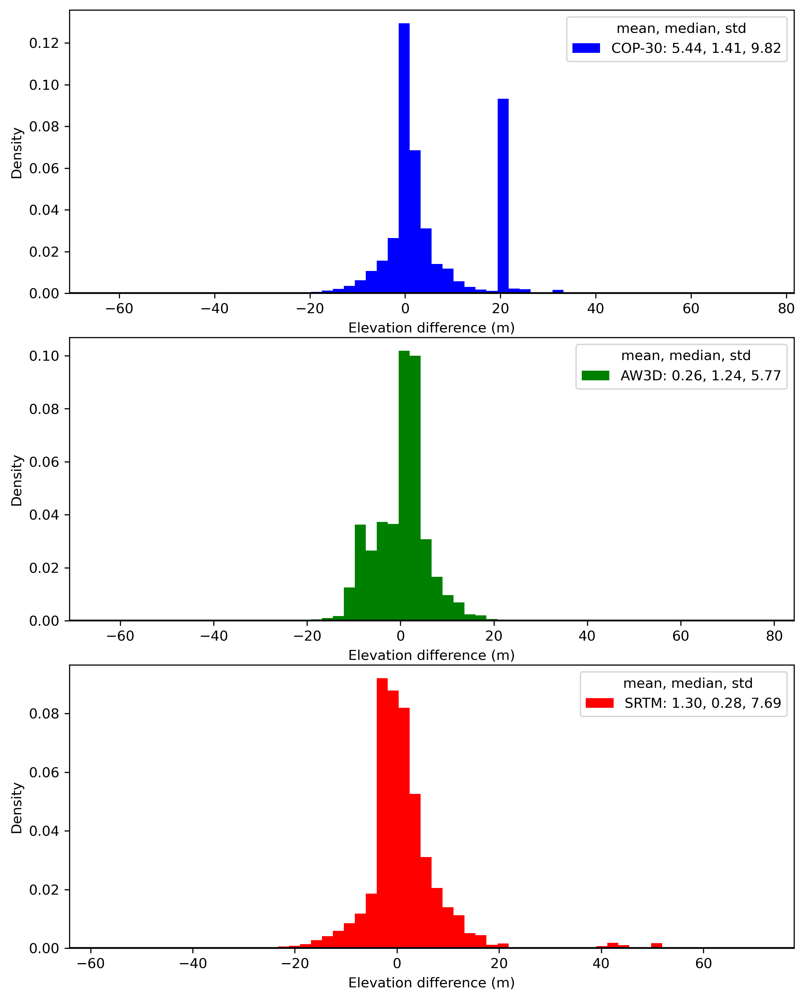

In [193]:
fig, axes = plt.subplots(3, 1, figsize=(8, 10))
fig.tight_layout()
ax1, ax2, ax3 = axes.flatten()
fig.set_dpi(300)

diff = gdf2.glo30_ell - gdf2.Photon_Height
ax1.hist(diff, bins=60, density=True, color = "b", label=f'COP-30: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')


diff = gdf2.qdt3_float - gdf2.Photon_Height
ax2.hist(diff, bins=60, density=True, color = "g", label=f'AW3D: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')

diff = gdf2.salta5_float - gdf2.Photon_Height
ax3.hist(diff, bins=60, density=True, color = "red", label=f'SRTM: {np.nanmean(diff):.2f}, {np.nanmedian(diff):.2f}, {np.nanstd(diff):.2f}')

ax1.axhline(0, color='k')
ax2.axhline(0, color='k')
ax3.axhline(0, color='k')

ax1.set_ylabel('Density', fontsize=10)
ax1.set_xlabel('Elevation difference (m)', fontsize=10)

ax2.set_ylabel('Density', fontsize=10)
ax2.set_xlabel('Elevation difference (m)', fontsize=10)

ax3.set_ylabel('Density', fontsize=10)
ax3.set_xlabel('Elevation difference (m)', fontsize=10)

ax1.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);
ax2.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);
ax3.legend(fontsize=10, title='  mean, median, std', title_fontsize=10);


plt.savefig('Density.png', bbox_inches='tight')